In [1]:
import numpy as np
import matplotlib.pyplot as plt
from numpy import sqrt
from matplotlib.patches import Polygon
plt.rc('text', usetex=True)


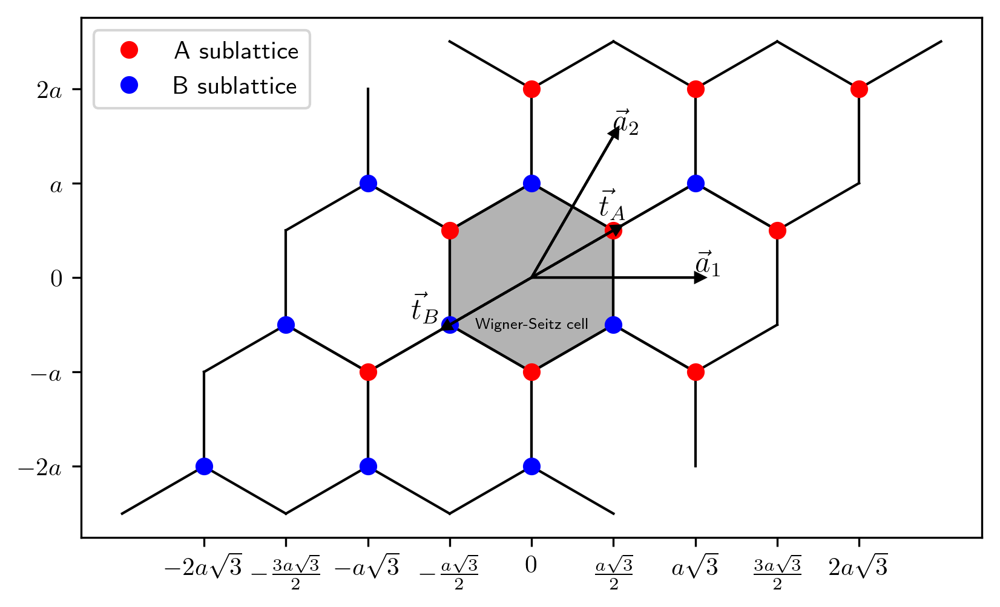

In [149]:
# creating a plot for a few unit cells of graphene


def rotate_60i(v, i):
    c = np.cos(i*np.pi/3)
    s = np.sin(i*np.pi/3)
    return np.array([c*v[0] - s*v[1], s*v[0] + c*v[1]])

fig, ax = plt.subplots(dpi=300)

a1 = np.array([sqrt(3), 0])
a2 = rotate_60i(a1, 1)
tA = np.array([sqrt(3)/2, 1/2])
tB = -tA

unit_cell_centers = [a1 * i + a2 * j for i in range(-1, 2) for j in range(-1, 2)]

A_points = [center + tA for center in unit_cell_centers]
B_points = [center + tB for center in unit_cell_centers]

for point in A_points:
    for i in range(3):
        bondto = rotate_60i(np.array([0, -1]), 2*i)
        ax.plot([point[0], point[0] + bondto[0]], [point[1], point[1] + bondto[1]], 'k-', lw=1)

for point in B_points:
    for i in range(3):
        bondto = rotate_60i(np.array([0, 1]), 2*i)
        ax.plot([point[0], point[0] + bondto[0]], [point[1], point[1] + bondto[1]], 'k-', lw=1)


for point in A_points:
    ax.plot(point[0], point[1], 'ro')

for point in B_points:
    ax.plot(point[0], point[1], 'bo')



# shade in the Wigner-Seitz cell
polygon = Polygon([tB + a2, tA - a1, tB, tA - a2, tB + a1, tA], edgecolor=None, facecolor='0.7', lw=None)
ax.add_patch(polygon) 



# draw and label a1 and a2 with label at the head of the arrow
ax.arrow(0, 0, a1[0], a1[1], head_width=0.1, head_length=0.1, fc='k', ec='k')
ax.text(a1[0], a1[1], r'$\vec{a}_1$', fontsize=12, ha='left', va='bottom')
ax.arrow(0, 0, a2[0], a2[1], head_width=0.1, head_length=0.1, fc='k', ec='k')
ax.text(a2[0], a2[1], r'$\vec{a}_2$', fontsize=12, ha='left', va='bottom')

# draw and label tA and tB with label at the head of the arrow
ax.arrow(0, 0, tA[0], tA[1], head_width=0.1, head_length=0.1, fc='k', ec='k', zorder=2)
ax.text(tA[0], tA[1]+0.1, r'$\vec{t}_A$', fontsize=12, ha='center', va='bottom')
ax.arrow(0, 0, tB[0], tB[1], head_width=0.1, head_length=0.1, fc='k', ec='k', zorder=2)
ax.text(tB[0] - 0.1, tB[1], r'$\vec{t}_B$', fontsize=12, ha='right', va='bottom')



# make a legend where red is A and blue is B
ax.plot([], [], 'ro', label='A sublattice')
ax.plot([], [], 'bo', label='B sublattice')

# label shaded area as Wigner-Seitz cell
ax.text(0, -0.5, 'Wigner-Seitz cell', fontsize=6, ha='center', va='center')
ax.legend(fontsize=10)

# x ticks should be at half-integer multiples of a1
ax.set_xticks([i*a1[0]/2 for i in range(-4, 5)])
ax.set_xticklabels(["$-2a\\sqrt{3}$", "$-\\frac{3a\\sqrt{3}}{2}$", 
"$-a\\sqrt{3}$", "$-\\frac{a\\sqrt{3}}{2}$", "$0$", 
"$\\frac{a\\sqrt{3}}{2}$", "$a\\sqrt{3}$", "$\\frac{3a\\sqrt{3}}{2}$", "$2a\\sqrt{3}$"], fontsize=10)

# y ticks from -2a to 2a
ax.set_yticks(range(-2, 3))
ax.set_yticklabels(["$-2a$", "$-a$", "$0$", "$a$", "$2a$"], fontsize=10)

ax.set_aspect('equal')
plt.savefig('graphene_unit_cell.png', bbox_inches="tight")
plt.show()





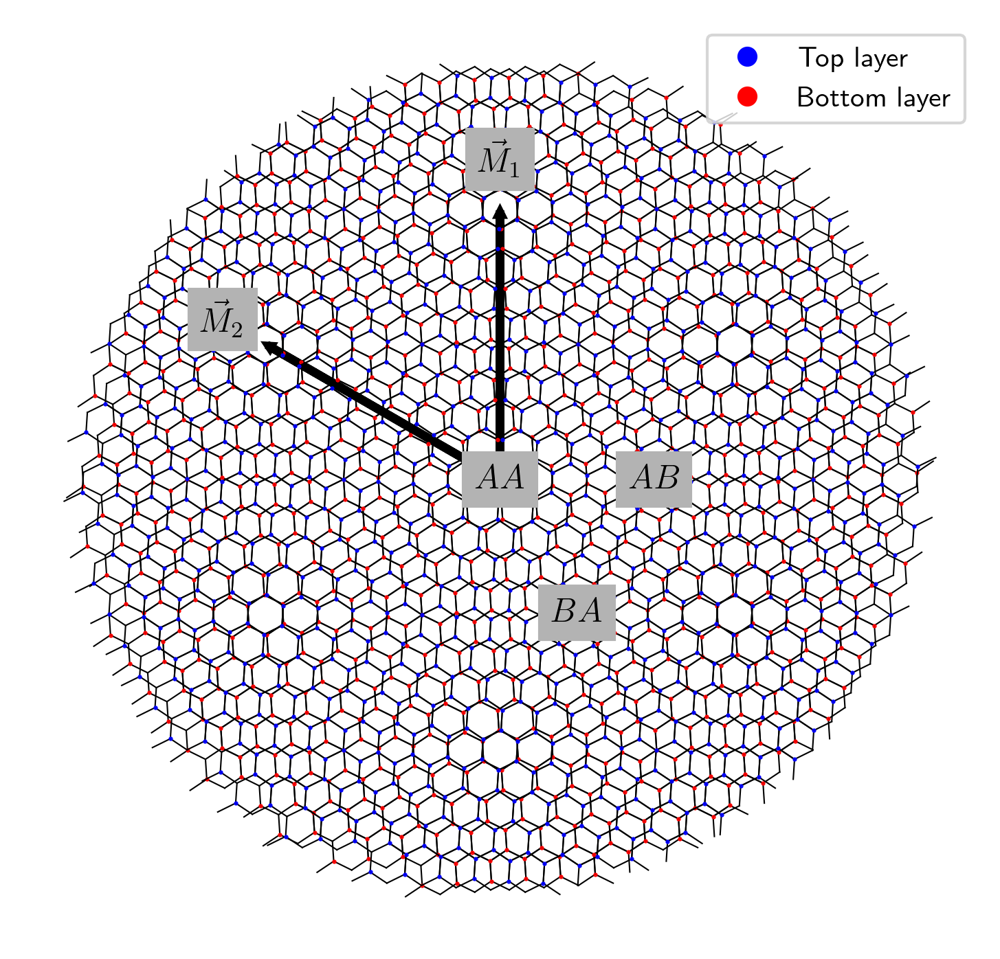

In [75]:
# creating a plot for twisted bilayer graphene


def rotate_60i(v, i):
    c = np.cos(i*np.pi/3)
    s = np.sin(i*np.pi/3)
    return np.array([c*v[0] - s*v[1], s*v[0] + c*v[1]])

def rotate_theta(v, theta):
    c = np.cos(theta)
    s = np.sin(theta)
    return np.array([c*v[0] - s*v[1], s*v[0] + c*v[1]])

fig, ax = plt.subplots(figsize=(6, 6), dpi=300)

a1 = np.array([sqrt(3), 0])
a2 = rotate_60i(a1, 1)
tA = np.array([sqrt(3)/2, 1/2])
tB = -tA



n = 20
unit_cell_centers = [a1 * i + a2 * j for i in range(-n,  n+1) for j in range(-n, n+1)]
unit_cell_centers = [x for x in unit_cell_centers if np.linalg.norm(x) < n]

A_points = [center + tA for center in unit_cell_centers]
B_points = [center + tB for center in unit_cell_centers]

theta = 0.13
for point in A_points:
    point = rotate_theta(point, theta/2)
    for i in range(3):
        bondto = rotate_60i(np.array([0, -1]), 2*i)
        bondto = rotate_theta(bondto, theta/2)
        ax.plot([point[0], point[0] + bondto[0]], [point[1], point[1] + bondto[1]], 'k-', lw=10/n)

for point in B_points:
    point = rotate_theta(point, theta/2)
    for i in range(3):
        bondto = rotate_60i(np.array([0, 1]), 2*i)
        bondto = rotate_theta(bondto, theta/2)
        ax.plot([point[0], point[0] + bondto[0]], [point[1], point[1] + bondto[1]], 'k-', lw=10/n)

for point in A_points + B_points:
    point = rotate_theta(point, theta/2)
    ax.plot(point[0], point[1], 'ro', markersize=10/n)

for point in A_points:
    point = rotate_theta(point, -theta/2)
    for i in range(3):
        bondto = rotate_60i(np.array([0, -1]), 2*i)
        bondto = rotate_theta(bondto, -theta/2)
        ax.plot([point[0], point[0] + bondto[0]], [point[1], point[1] + bondto[1]], 'k-', lw=10/n)

for point in B_points:
    point = rotate_theta(point, -theta/2)
    for i in range(3):
        bondto = rotate_60i(np.array([0, 1]), 2*i)
        bondto = rotate_theta(bondto, -theta/2)
        ax.plot([point[0], point[0] + bondto[0]], [point[1], point[1] + bondto[1]], 'k-', lw=10/n)

for point in A_points + B_points:
    point = rotate_theta(point, -theta/2)
    ax.plot(point[0], point[1], 'bo', markersize=10/n)

# 
ax.plot([], [], 'bo', label='Top layer')
ax.plot([], [], 'ro', label='Bottom layer')
ax.legend(loc='upper right', fontsize=10)



delta = 2 * 4 * np.pi / (3 * sqrt(3)) * np.sin(theta/2)
moire1 = 4*np.pi / (3 * delta) * np.array([0, 1])
moire2 = 4*np.pi / (3 * delta) * np.array([-sqrt(3)/2, 1/2])
ax.arrow(0, 0, moire1[0], moire1[1], lw=3, head_width=0.1, head_length=0.1, fc='k', ec='k', length_includes_head=True)
ax.text(1.2*moire1[0], 1.2*moire1[1], r'$\vec{M}_1$', fontsize=12, ha='center', va='center', backgroundcolor='0.7')
ax.arrow(0, 0, moire2[0], moire2[1], lw=3, head_width=0.1, head_length=0.1, fc='k', ec='k', length_includes_head=True)
ax.text(1.2*moire2[0], 1.2*moire2[1], r'$\vec{M}_2$', fontsize=12, ha='center', va='center', backgroundcolor='0.7')



ax.text(0, 0, r'$AA$', fontsize=12, ha='center', va='center', backgroundcolor='0.7')
BA = 1/3 * (-moire1 - moire2)
ax.text(BA[0], BA[1], r'$BA$', fontsize=12, ha='center', va='center', backgroundcolor='0.7')
AB = 1/3 * (-2*moire2 + moire1)
ax.text(AB[0], AB[1], r'$AB$', fontsize=12, ha='center', va='center', backgroundcolor='0.7')



# turn off axes and bounding box
ax.axis('off')

ax.set_aspect('equal')
plt.savefig('tbg.png', bbox_inches="tight")
plt.show()


In [ ]:
delta = 2 * 4 * np.pi / (3 * sqrt(3)) * np.sin(theta/2)
print(delta)
deltaasdf = np.linalg.norm(2/3 * G1)

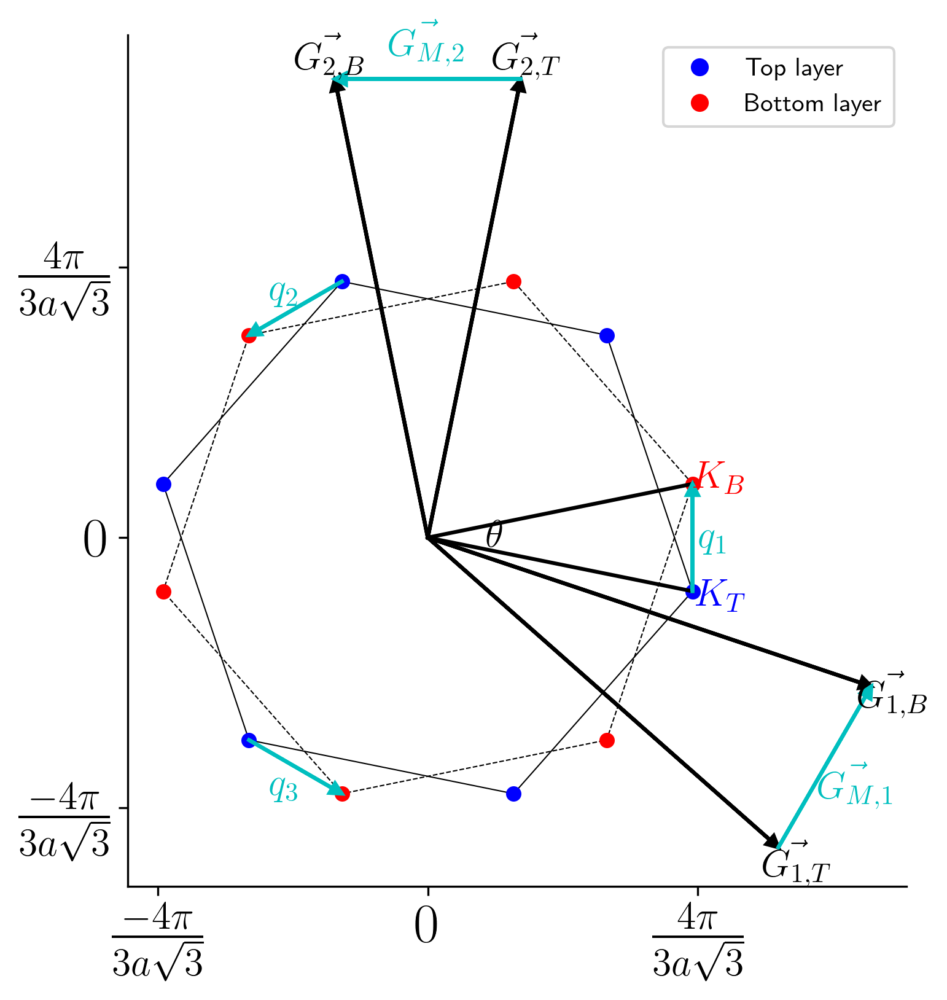

In [80]:
# creating a plot for reciprocal space of two overlayed graphene layers

fig, ax = plt.subplots(dpi=300, figsize=(6, 6))
theta = 0.4

G1 = 2*np.pi/sqrt(3) * np.array([1, -1/sqrt(3)])
G2 = 2*np.pi/sqrt(3) * np.array([0, 2/sqrt(3)])

K = 2/3 * (G1 + G2/2)
Kp = rotate_60i(K, 1)

delta = 2 * 4 * np.pi / (3 * sqrt(3)) * np.sin(theta/2)

top_points = [rotate_60i(rotate_theta(K, -theta/2), i) for i in range(6)]
bottom_points = [rotate_60i(rotate_theta(K, theta/2), i) for i in range(6)]
top_poly = Polygon(top_points, edgecolor='k', facecolor='none', lw=0.5, linestyle='-')
bottom_poly = Polygon(bottom_points, edgecolor='k', facecolor='none', lw=0.5, linestyle='--')
ax.add_patch(top_poly)
ax.add_patch(bottom_poly)

for point in top_points:
    ax.plot(point[0], point[1], 'bo', markersize=5)
for point in bottom_points:
    ax.plot(point[0], point[1], 'ro', markersize=5)

# x ticks are from -3 to 3 times 2pi/(3a * sqrt(3))
ax.set_xticks([i*4*np.pi/(3*sqrt(3)) for i in range(-1, 2)])
ax.set_xticklabels(["$\\frac{-4\\pi}{3a\\sqrt{3}}$",
"$0$", "$\\frac{4\\pi}{3a\\sqrt{3}}$"], fontsize=22)

ax.set_yticks([i*4*np.pi/(3*sqrt(3)) for i in range(-1, 2)])
ax.set_yticklabels(["$\\frac{-4\\pi}{3a\\sqrt{3}}$",
"$0$", "$\\frac{4\\pi}{3a\\sqrt{3}}$"], fontsize=22)


Ktop = top_points[0]
Kbottom = bottom_points[0]
ax.plot([0, Ktop[0]], [0, Ktop[1]], 'k-')
ax.plot([0, Kbottom[0]], [0, Kbottom[1]], 'k-')
ax.text(np.linalg.norm(K)/4, 0, r"$\theta$", fontsize=15, ha='center', va='center') #, backgroundcolor='0.7')
ax.text(1.1*Ktop[0], 1.1*Ktop[1], rf"$K_{{T}}$", fontsize=15, ha='center', va='center', color='b')
ax.text(1.1*Kbottom[0], 1.1*Kbottom[1], rf"$K_{{B}}$", fontsize=15, ha='center', va='center', color='r')

for i in range(3):
    Kt = rotate_60i(Ktop, 2*i)
    Kb = rotate_60i(Kbottom, 2*i)
    ax.arrow(Kt[0], Kt[1], Kb[0]-Kt[0], Kb[1]-Kt[1], lw=1.5, head_width=0.1, 
        head_length=0.1, fc='c', ec='c', length_includes_head=True, zorder=2)
    ax.text(0.54*(Kt[0] + Kb[0]), 0.54*(Kt[1] + Kb[1]), rf"$q_{{{i+1}}}$", fontsize=15, ha='center', va='center', color='c')



# ax.arrow(Ktop[0], Ktop[1], Kbottom[0]-Ktop[0], Kbottom[1]-Ktop[1], lw=1.5, head_width=0.1, 
#     head_length=0.1, fc='c', ec='c', length_includes_head=True, zorder=2)
# ax.text(0.54*(Ktop[0] + Kbottom[0]), 0.54*(Ktop[1] + Kbottom[1]), r'$q_1$', fontsize=12, ha='center', va='center', color='c')



# create G1T, G1B, G2T, G2B
G1T = rotate_theta(G1, -theta/2)
G1B = rotate_theta(G1, theta/2)
G2T = rotate_theta(G2, -theta/2)
G2B = rotate_theta(G2, theta/2)
G_TB_12 = [G1T, G1B, G2T, G2B]
labels = [r"$\vec{G_{1, T}}$", r"$\vec{G_{1, B}}$", r"$\vec{G_{2, T}}$", r"$\vec{G_{2, B}}$"]
for point, label in zip(G_TB_12, labels):
    ax.arrow(0, 0, point[0], point[1], lw=1.5, head_width=0.1, head_length=0.1, fc='k', ec='k', length_includes_head=True)    
    ax.text(1.05*point[0], 1.051*point[1], label, fontsize=15, ha='center', va='center')# , backgroundcolor='0.7')

ax.arrow(G1T[0], G1T[1], G1B[0]-G1T[0], G1B[1]-G1T[1], lw=1.5, head_width=0.1, head_length=0.1, fc='c', ec='c', length_includes_head=True, zorder=2)
ax.text(0.54*(G1T[0] + G1B[0]), 0.54*(G1T[1] + G1B[1]), r'$\vec{G_{M, 1}}$', fontsize=15, ha='center', va='center', color='c')
ax.arrow(G2T[0], G2T[1], G2B[0]-G2T[0], G2B[1]-G2T[1], lw=1.5, head_width=0.1, head_length=0.1, fc='c', ec='c', length_includes_head=True, zorder=2)
ax.text(0.54*(G2T[0] + G2B[0]), 0.54*(G2T[1] + G2B[1]), r'$\vec{G_{M, 2}}$', fontsize=15, ha='center', va='center', color='c')

ax.plot([], [], 'bo', label=r"Top layer")
ax.plot([], [], 'ro', label=r"Bottom layer")
ax.legend(loc='upper right', fontsize=10)

ax.set_aspect('equal')
ax.spines[['right', 'top']].set_visible(False)

plt.savefig('moire_recip.png', bbox_inches="tight")
plt.show()







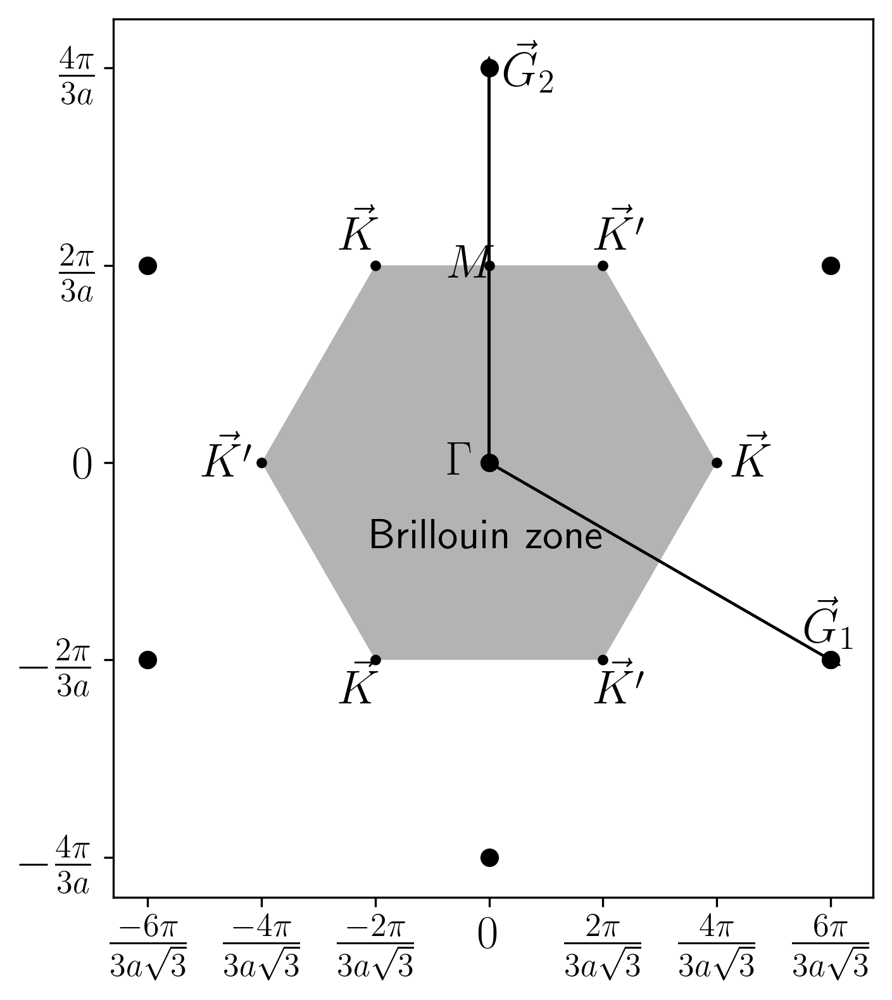

In [150]:
# Creating the reciprocal lattice
fig, ax = plt.subplots(dpi=300, figsize=(6, 6))

G1 = 2*np.pi/sqrt(3) * np.array([1, -1/sqrt(3)])
G2 = 2*np.pi/sqrt(3) * np.array([0, 2/sqrt(3)])

K = 2/3 * (G1 + G2/2)
Kp = rotate_60i(K, 1)



# Plot and label Brillouin zone
polygon = Polygon([rotate_60i(K, i) for i in range(6)], edgecolor=None, facecolor='0.7', lw=None)
ax.add_patch(polygon)
for i in range(3):
    point = rotate_60i(K, 2*i)
    ax.plot(point[0], point[1], 'ko', markersize=3)
    ax.text(1.15*point[0], 1.15*point[1], r'$\vec{K}$', fontsize=18, ha='center', va='center')
for i in range(3):
    point = rotate_60i(Kp, 2*i)
    ax.plot(point[0], point[1], 'ko', markersize=3)
    ax.text(1.15*point[0], 1.15*point[1], r"$\vec{K'}$", fontsize=18, ha='center', va='center')
# label Brillouin zone with text
ax.text(0, -0.8, 'Brillouin zone', fontsize=16, ha='center', va='center')

# draw some reciprocal lattice vectors
unit_cell_centers = [G1 * i[0] + G2 * i[1] for i in [(0, 0), (1, 0), (0, 1), (1, 1), (-1, 0), (0, -1), (-1, -1)]]
for point in unit_cell_centers:
    ax.plot(point[0], point[1], 'ko')

# Draw and label G1 and G2
ax.arrow(0, 0, G1[0], G1[1], head_width=0.1, head_length=0.1, fc='k', ec='k')
ax.text(G1[0], G1[1]+0.1, r'$\vec{G}_1$', fontsize=18, ha='center', va='bottom')
ax.arrow(0, 0, G2[0], G2[1], head_width=0.1, head_length=0.1, fc='k', ec='k')
ax.text(G2[0]+0.15, G2[1], r'$\vec{G}_2$', fontsize=18, ha='left', va='center')

# Label Gamma and M points
ax.text(-0.3, 0, r'$\Gamma$', fontsize=18, ha='center', va='center')
# the next point should use a thin marker
ax.plot(0, G2[1]/2, 'ko', markersize=3)
ax.text(-0.2, G2[1]/2, r'$M$', fontsize=18, ha='center', va='center')

# plt.xlim(-5, 5)
# plt.ylim(-5, 5)

# x ticks are from -3 to 3 times 2pi/(3a * sqrt(3))
ax.set_xticks([i*2*np.pi/(3*sqrt(3)) for i in range(-3, 4)])
ax.set_xticklabels(["$\\frac{-6\\pi}{3a\\sqrt{3}}$", "$\\frac{-4\\pi}{3a\\sqrt{3}}$",
"$\\frac{-2\\pi}{3a\\sqrt{3}}$", "$0$", "$\\frac{2\\pi}{3a\\sqrt{3}}$",
"$\\frac{4\\pi}{3a\\sqrt{3}}$", "$\\frac{6\\pi}{3a\\sqrt{3}}$"], fontsize=18)

# y ticks are from -3 to 3 times 2pi/(3a)
ax.set_yticks([i*2*np.pi/(3) for i in range(-2, 3)])
ax.set_yticklabels(["$-\\frac{4\\pi}{3a}$",
"$-\\frac{2\\pi}{3a}$", "$0$", "$\\frac{2\\pi}{3a}$",
"$\\frac{4\\pi}{3a}$"], fontsize=18)



ax.set_aspect('equal')

plt.savefig('reciprocal_lattice.png', bbox_inches="tight")
plt.show()






In [ ]:


all_eigvals = [np.linalg.eigvalsh(GM.get_gammaM_matrix(p, 0.0, 0.64, 4)) for p in points]
# positive_eigvals = [[e for e in eigvals if e >= 0] for eigvals in all_eigvals]
# lowest_eigvals = [min(eigvals) for eigvals in positive_eigvals]
# second_lowest_eigvals = [sorted(eigvals)[1] for eigvals in positive_eigvals]
# lowest_eigvals = [min(np.abs(eigvals)) for eigvals in all_eigvals]

# sixth_eigvals = [sorted(eigvals)[5] for eigvals in all_eigvals]
#seventh_eigvals = [sorted(eigvals)[6] for eigvals in all_eigvals]
middle_eigvals = [sorted(eigvals)[len(eigvals)//2] for eigvals in all_eigvals]

x = [p[0] for p in points] # + [p[0] for p in points]
y = [p[1] for p in points] # + [p[1] for p in points]
z = middle_eigvals # sixth_eigvals + seventh_eigvals # + second_lowest_eigvals


import plotly.graph_objects as go
# Create a 3D scatter plot
fig = go.Figure(data=[go.Scatter3d(x=x, y=y, z=z, mode='markers', marker=dict(size=2, color=z, colorscale='Viridis'))])


# Add titles and labels
fig.update_scenes(aspectratio = {'x': sqrt(3)/2, 'y': 1, 'z': 0.5}) # also works for me. Thank you! – 



fig.write_html("surface_plot.html")

# Show the plot
fig.show()

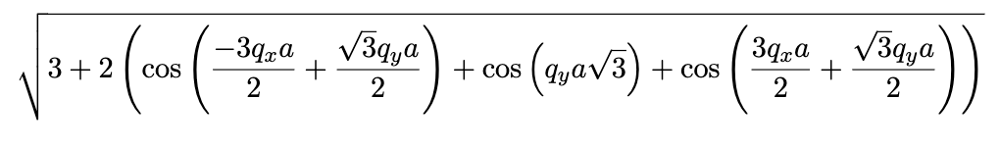

In [ ]:
def eigvals(kx, ky):
    return np.sqrt(1 + 4*np.cos(np.sqrt(3)*kx/2)*np.cos(ky/2) + 4*np.cos(ky/2)**2)

In [83]:
def eigvals(kx, ky):
    a1 = np.array([sqrt(3), 0])
    a2 = np.array([sqrt(3)/2, 3/2])
    e_pos = sqrt(3 + 2*(np.cos(kx*a2[0] + ky*a2[1]) + np.cos(kx*a1[0] + ky*a1[1]) + np.cos(kx*(a2[0] - a1[0]) + ky*(a2[1] - a1[1]))))
    return e_pos

In [97]:
points = [(kx, ky) for kx in np.linspace(-3, 3, 200) for ky in np.linspace(-3, 3, 200)]

all_eigvals = [eigvals(p[0], p[1]) for p in points]

x = [p[0] for p in points] + [p[0] for p in points]
y = [p[1] for p in points] + [p[1] for p in points]
z = all_eigvals + [-e for e in all_eigvals]

import plotly.graph_objects as go
# Create a 3D scatter plot
fig = go.Figure(data=[go.Scatter3d(x=x, y=y, z=z, mode='markers', marker=dict(size=2, color=z, colorscale='Viridis'))])

# Label the x axis as $k_x a$
fig.update_layout(
    scene=dict(
        xaxis=dict(
            title="k<sub>x</sub> a",
            title_font=dict(size=20),  # Font size for x-axis title
            tickfont=dict(size=15)    # Font size for x-axis tick labels
        ),
        yaxis=dict(
            title="k<sub>y</sub> a",
            title_font=dict(size=20),  # Font size for y-axis title
            tickfont=dict(size=15)    # Font size for y-axis tick labels
        ),
        zaxis=dict(
            title="E",
            title_font=dict(size=20),  # Font size for z-axis title
            tickfont=dict(size=15)    # Font size for z-axis tick labels
        )
    )
)


# Add titles and labels
# fig.update_scenes(aspectratio = {'x': sqrt(3)/2, 'y': 1, 'z': 0.5}) # also works for me. Thank you! – 

fig.write_html("surface_plot.html")

# Show the plot
fig.show()

In [101]:
Kamag = 4*np.pi/(3*sqrt(3))
points = [(kx, ky) for kx in np.linspace(-0.1 + Kamag, 0.1 + Kamag, 150) for ky in np.linspace(-0.1, 0.1, 150)]
points = [point for point in points if np.linalg.norm(np.array(point) - np.array([Kamag, 0])) < 0.1]

all_eigvals = [eigvals(p[0], p[1]) for p in points]

x = [p[0] for p in points] + [p[0] for p in points]
y = [p[1] for p in points] + [p[1] for p in points]
z = all_eigvals + [-e for e in all_eigvals]

import plotly.graph_objects as go
# Create a 3D scatter plot
fig = go.Figure(data=[go.Scatter3d(x=x, y=y, z=z, mode='markers', marker=dict(size=2, color=z, colorscale='Viridis'))])


fig.update_layout(
    scene=dict(
        xaxis=dict(
            title="k<sub>x</sub> a",
            title_font=dict(size=20),  # Font size for x-axis title
            tickfont=dict(size=15)    # Font size for x-axis tick labels
        ),
        yaxis=dict(
            title="k<sub>y</sub> a",
            title_font=dict(size=20),  # Font size for y-axis title
            tickfont=dict(size=15)    # Font size for y-axis tick labels
        ),
        zaxis=dict(
            title="E",
            title_font=dict(size=20),  # Font size for z-axis title
            tickfont=dict(size=15)    # Font size for z-axis tick labels
        )
    )
)

# Add titles and labels
# fig.update_scenes(aspectratio = {'x': sqrt(3)/2, 'y': 1, 'z': 0.5}) # also works for me. Thank you! – 

fig.write_html("surface_plot2.html")

# Show the plot
fig.show()